In [41]:
import pandas as pd
import geopandas as gpd
import os
import geopandas as gpd

os.chdir("/Users/vittoriameroni/Documents/venice-data-week-data")
gdf = gpd.read_file("1740-catastici/1740_catastici_version20250625.geojson")

In [42]:
print(gdf.head())

        uid        author                          tif_path_img   owner_code  \
0  CNC-0001  Davide Drago  /catastici/Catastici-436/10/1393.tif          PPL   
1  CNC-0002  Davide Drago  /catastici/Catastici-436/10/1393.tif          PPL   
2  CNC-0003  Davide Drago  /catastici/Catastici-436/10/1393.tif  ent_REL_TTL   
3  CNC-0004  Davide Drago  /catastici/Catastici-436/10/1393.tif          PPL   
4  CNC-0005  Davide Drago  /catastici/Catastici-436/10/1393.tif          PPL   

  owner_count PP_OwnerCode_SIMPL  \
0           1            Private   
1           1            Private   
2           1   Religious entity   
3           1            Private   
4           1            Private   

                                          owner_name            ten_name  \
0  Liberal Campi secondo prete titolato della Chiesa      Francesco Zeni   
1    Filippo Frari terzo prete titolato della Chiesa  Dio M'aiuti Lazara   
2                              Pievan di San Cancian   Bortolamio Piazza  

In [43]:
import json
path = "1740-catastici/index/dictionaries/std_mappings/people_to_mentions/title_to_std.json"

with open(path, "r") as f:
    title_mapping_list = json.load(f)

title_mapping_dict = {entry["key"]: entry["value"] for entry in title_mapping_list}

In [44]:

gdf['PP_Owner_Title_clean'] = gdf['PP_Owner_Title'].astype(str).str.strip().str.lower()
gdf['PP_Owner_Title_std'] = gdf['PP_Owner_Title_clean'].map(title_mapping_dict)

gdf['PP_Owner_Title_std'] = gdf['PP_Owner_Title_std'].fillna(gdf['PP_Owner_Title_clean'])
title_counts = gdf['PP_Owner_Title_std'].value_counts()
title_counts_sorted = title_counts.sort_index()
print(title_counts_sorted)


PP_Owner_Title_std
                             16899
_                             2943
_,_,monaca                       1
_,_,nobil homo                   1
_,_,nobil homo ser abbate        1
                             ...  
titolato                         6
titolo presbiterale              9
venerande monache                6
vicario                          1
| nobil homo,nobil homo          2
Name: count, Length: 507, dtype: int64


In [45]:
n_unique = gdf['PP_Owner_Title_std'].nunique()
print(n_unique)

507


In [46]:


nobility_keywords = [
    "nobil", "conte", "marches", "cavaliere", "illustrissim",
    "eccellentissim", "patrizi", "barone", "duc", "don", "donna"
]

religious_keywords = [
    "prete", "abate", "abbate", "monac", "padre", "vescovo",
    "arcivescovo", "canonic", "reverendo", "reverenda",
    "monsignor", "pievan", "patriarca", "suor", "religios", "diacono"
]

def check_keywords(title, keywords):
    if pd.isna(title):
        return False
    title = str(title).lower()
    return any(kw in title for kw in keywords)

gdf['is_nobility'] = gdf['PP_Owner_Title_std'].apply(lambda x: check_keywords(x, nobility_keywords))
gdf['is_religious'] = gdf['PP_Owner_Title_std'].apply(lambda x: check_keywords(x, religious_keywords))

gdf['is_middle_class'] = False
gdf['is_lower_class'] = False
df_sociale = gdf[['owner_code', 'owner_name', 'is_nobility', 'is_religious', 'is_middle_class', 'is_lower_class']].copy()
df_sociale = df_sociale.drop_duplicates()
print(df_sociale.head(20))

         owner_code                                         owner_name  \
0               PPL  Liberal Campi secondo prete titolato della Chiesa   
1               PPL    Filippo Frari terzo prete titolato della Chiesa   
2       ent_REL_TTL                              Pievan di San Cancian   
4               PPL                         Agostin Filippi di Vicenza   
5               PPL                                   Ottavio Bertotti   
7               PPL                               Bortolamio Musitelli   
8               PPL                                     Giacomo Bertin   
9   ent_REL_TTL_UNL                                Pievan della Chiesa   
12              PPL                         Giovanni Francesco Morsoni   
13              PPL                                Nobil homo Lipomano   
16              PPL            Nobil homo Giovannio Francesco Morosini   
17              PPL             Nobil homo Giovanni Francesco Morosini   
19              PPL                   

In [86]:

property_counts = gdf['owner_name'].value_counts()



In [87]:

gdf['property_count'] = gdf['owner_name'].map(property_counts)



In [88]:

owner_property_counts = gdf['owner_name'].value_counts()


df_sociale['property_count'] = df_sociale['owner_name'].map(owner_property_counts)

In [89]:

gdf['an_rendi'] = pd.to_numeric(gdf['an_rendi'], errors='coerce')
gdf['quantity_income'] = pd.to_numeric(gdf['quantity_income'], errors='coerce')
gdf['is_self_occupied'] = (
    ((gdf['an_rendi'].isna()) | (gdf['an_rendi'] == 0)) &
    ((gdf['quantity_income'].isna()) | (gdf['quantity_income'] == 0)) &
    (gdf['quality_income'].isna() | (gdf['quality_income'].astype(str).str.strip() == ""))
)
self_occupied_counts = gdf[gdf['is_self_occupied']].groupby('owner_name').size()
df_sociale['self_occupied_count'] = df_sociale['owner_name'].map(self_occupied_counts).fillna(0).astype(int)
print(df_sociale[['owner_name', 'property_count', 'self_occupied_count']].head())

                                          owner_name  property_count  \
0  Liberal Campi secondo prete titolato della Chiesa               1   
1    Filippo Frari terzo prete titolato della Chiesa               2   
2                              Pievan di San Cancian               1   
4                         Agostin Filippi di Vicenza               1   
5                                   Ottavio Bertotti               2   

   self_occupied_count  
0                    0  
1                    0  
2                    0  
4                    0  
5                    0  


In [90]:
df_sociale['rented_count'] = df_sociale['property_count'] - df_sociale['self_occupied_count']

In [91]:
rent_df = gdf[~gdf['is_self_occupied']].copy()
rent_df['an_rendi'] = pd.to_numeric(rent_df['an_rendi'], errors='coerce')

rent_total = rent_df.groupby('owner_name')['an_rendi'].sum()

df_sociale['total_rent_income'] = df_sociale['owner_name'].map(rent_total).fillna(0)

In [92]:
distribution_house= df_sociale['property_count'].value_counts().sort_index()

print(distribution_house)

property_count
1      8484
2      1965
3       811
4       451
5       283
       ... 
97        1
108       1
115       1
244       1
279       1
Name: count, Length: 66, dtype: int64


In [93]:
df_sociale['is_nobility'] = df_sociale['is_nobility'] | (df_sociale['property_count'] >= 4)
df_sociale['is_middle_class'] = df_sociale.apply(
    lambda row: (
        not row['is_nobility'] and
        not row['is_religious'] and
        row.get('property_count', 0) >= 1
    ),
    axis=1
)

In [94]:

owner = set(gdf['owner_name'].dropna().unique())
tenant = set(gdf['ten_name'].dropna().unique())
both = owner & tenant
same_row = set(gdf[gdf['owner_name'] == gdf['ten_name']]['owner_name'].dropna().unique())
both_2 = both - same_row

df_sociale['is_middle_class'] = df_sociale['is_middle_class'] | df_sociale.apply(
    lambda row: (
        (row['owner_name'] in both_2)
        and not row['is_nobility']
        and not row['is_religious']
    ),
    axis=1
)
df_sociale.head()

,owner_code,owner_name,is_nobility,is_religious,is_middle_class,is_lower_class,property_count,self_occupied_count,rented_count,total_rent_income
0,PPL,Liberal Campi secondo prete titolato della Chiesa,False,True,False,False,1,0,1,70.0
1,PPL,Filippo Frari terzo prete titolato della Chiesa,False,True,False,False,2,0,2,64.0
2,ent_REL_TTL,Pievan di San Cancian,False,True,False,False,1,0,1,14.0
4,PPL,Agostin Filippi di Vicenza,False,False,True,False,1,0,1,70.0
5,PPL,Ottavio Bertotti,False,False,True,False,2,0,2,34.0


In [95]:

df_sociale = df_sociale.rename(columns={'owner_name': 'name', 'owner_code': 'code'})

name_sociale = set(df_sociale['name'].dropna())
tenants_new= gdf[~gdf['ten_name'].isin(name_sociale) & gdf['ten_name'].notna()].copy()

new_tenant_rows = tenants_new[['ten_name']].drop_duplicates().rename(columns={'ten_name': 'name'})
new_tenant_rows ['code'] = None
new_tenant_rows ['is_nobility'] = False
new_tenant_rows ['is_religious'] = False
new_tenant_rows ['is_middle_class'] = False
new_tenant_rows ['is_lower_class'] = False
new_tenant_rows['property_count'] = 0
df_sociale = pd.concat([df_sociale, new_tenant_rows], ignore_index=True)



In [96]:

tenant_not_known = df_sociale[
    (~df_sociale['is_nobility']) &
    (~df_sociale['is_religious']) &
    (~df_sociale['is_middle_class'])
]['name'].dropna().unique()

gdf_tenant_not_known = gdf[gdf['ten_name'].isin(tenant_not_known)].copy()

gdf_tenant_not_known['an_rendi'] = pd.to_numeric(gdf_tenant_not_known['an_rendi'], errors='coerce')

rent_per_tenant = gdf_tenant_not_known.groupby('ten_name')['an_rendi'].sum().reset_index()


rent_per_tenant = rent_per_tenant.sort_values(by='an_rendi', ascending=False)


print(rent_per_tenant)

                   ten_name  an_rendi
3366    Anzoletta Palmarini   28374.0
18564      Pietro Venturini   14975.0
20464        Valerio Marasi   13566.0
4338   Bernardin Chiapparin    7850.0
6194   Cristoforo Pertesana    1020.0
...                     ...       ...
15433       Marina Cavalina       0.0
15440       Marina Formenti       0.0
15453       Marina Piranese       0.0
15462   Marina Scandaggiato       0.0
0                                 0.0

[23162 rows x 2 columns]


In [97]:

poor_prop = gdf[gdf['PP_Function_PROPERTY'].str.contains("per carità", case=False, na=False)]

poor_name = set(poor_prop['owner_name'].dropna())
df_sociale['is_lower_class'] = df_sociale.apply(
    lambda row: (
        not row['is_nobility'] and
        not row['is_religious'] and
        row['name'] in poor_name
    ),
    axis=1
)

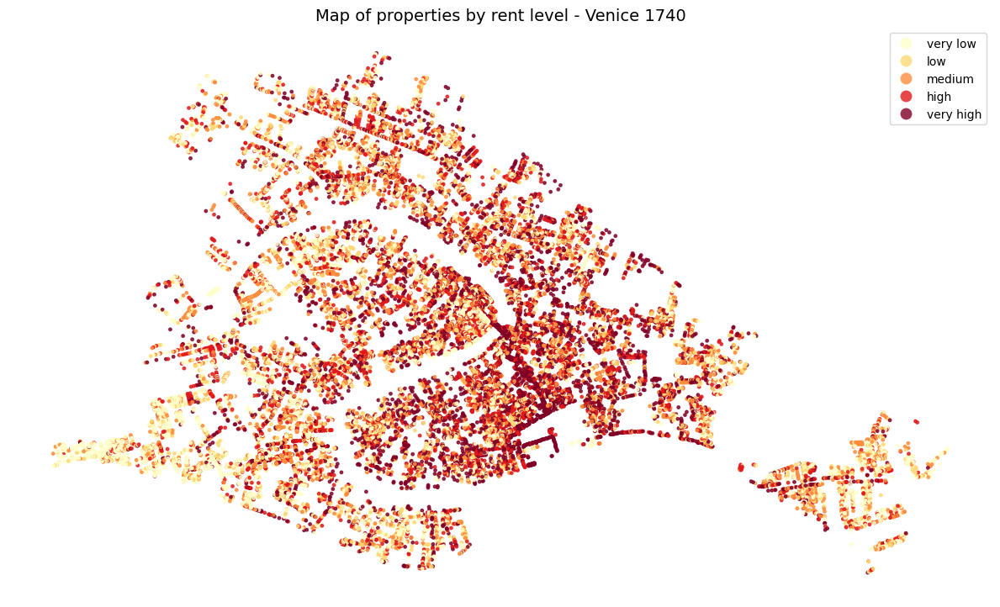

In [98]:

gdf = gpd.read_file("1740-catastici/1740_catastici_version20250625.geojson")

gdf['an_rendi'] = pd.to_numeric(gdf['an_rendi'], errors='coerce')

gdf_valid = gdf[gdf['an_rendi'].notna() & gdf.geometry.notna()].copy()

gdf_valid['rent_quantile'] = pd.qcut(
    gdf_valid['an_rendi'],
    q=5,
    labels=["very low", "low", "medium", "high", "very high"]
)

fig, ax = plt.subplots(figsize=(12, 12))
gdf_valid.plot(
    ax=ax,
    column='rent_quantile',
    cmap='YlOrRd',
    legend=True,
    markersize=6,
    alpha=0.8,
    categorical=True
)
ax.set_title("Map of properties by rent level - Venice 1740", fontsize=14)
ax.axis('off')
plt.tight_layout()
plt.show()

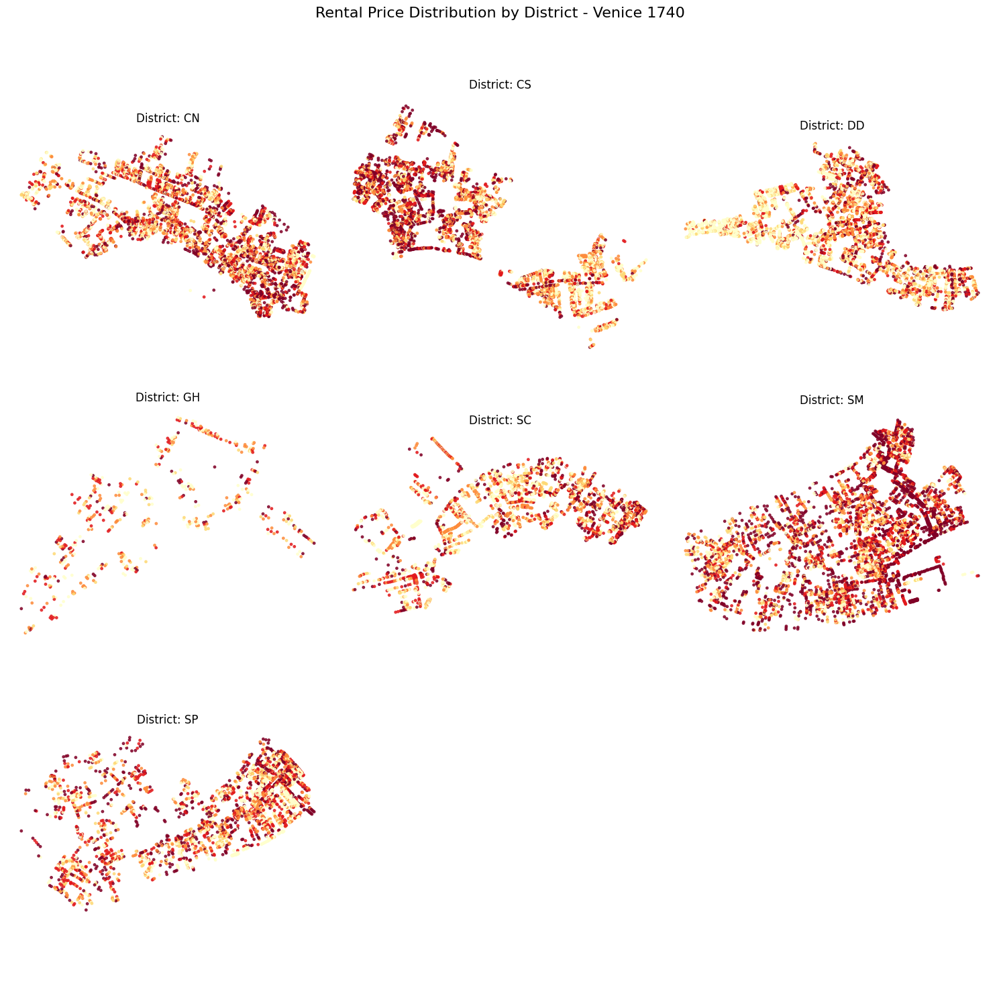

In [99]:

import matplotlib.pyplot as plt

gdf['an_rendi'] = pd.to_numeric(gdf['an_rendi'], errors='coerce')
gdf_valid = gdf[gdf['an_rendi'].notna() & gdf['sestiere'].notna() & gdf.geometry.notna()].copy()

gdf_valid['rent_quantile'] = pd.qcut(
    gdf_valid['an_rendi'],
    q=5,
    labels=["very low", "low", "medium", "high", "very high"]
)
sestieri = sorted(gdf_valid['sestiere'].unique())

n = len(sestieri)
cols = 3
rows = (n + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
axes = axes.flatten()

for i, sestiere in enumerate(sestieri):
    ax = axes[i]
    data = gdf_valid[gdf_valid['sestiere'] == sestiere]
    data.plot(
        ax=ax,
        column='rent_quantile',
        cmap='YlOrRd',
        legend=False,
        markersize=6,
        alpha=0.8,
        categorical=True
    )
    ax.set_title(f"District: {sestiere}")
    ax.axis('off')

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.suptitle("Rental Price Distribution by District - Venice 1740", fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

In [100]:
gdf['an_rendi'] = pd.to_numeric(gdf['an_rendi'], errors='coerce')

gdf_valid = gdf[gdf['an_rendi'].notna() & gdf.geometry.notna()].copy()

quantile_bins, bin_edges = pd.qcut(
    gdf_valid['an_rendi'], q=5, labels=["very low", "low", "medium", "high", "very high"], retbins=True
)

quantile_ranges = pd.DataFrame({
    "Rent Class": ["very low", "low", "medium", "high", "very high"],
    "Rent Range (ducats)": [f"{int(bin_edges[i])} – {int(bin_edges[i+1])}" for i in range(len(bin_edges)-1)]
})

print(quantile_ranges)

  Rent Class Rent Range (ducats)
0   very low              1 – 12
1        low             12 – 16
2     medium             16 – 28
3       high             28 – 48
4  very high          48 – 14934


In [101]:
gdf['an_rendi'] = pd.to_numeric(gdf['an_rendi'], errors='coerce')

gdf_valid = gdf[gdf['an_rendi'].notna() & gdf['sestiere'].notna()].copy()


quantile_ranges_by_sestiere = {}

for sestiere, group in gdf_valid.groupby('sestiere'):
    try:
        _, bin_edges = pd.qcut(group['an_rendi'], q=5, retbins=True, duplicates='drop')
        quantile_ranges_by_sestiere[sestiere] = [
            f"{int(bin_edges[i])} – {int(bin_edges[i+1])}" for i in range(len(bin_edges)-1)
        ]
    except ValueError:
        
        quantile_ranges_by_sestiere[sestiere] = ["Not enough data"]

sestiere_df = pd.DataFrame.from_dict(quantile_ranges_by_sestiere, orient='index')
sestiere_df.columns = [f"Q{i+1}" for i in range(sestiere_df.shape[1])]
sestiere_df.index.name = "Sestiere"

print(sestiere_df)

              Q1       Q2       Q3       Q4          Q5
Sestiere                                               
CN        2 – 12  12 – 16  16 – 26  26 – 45   45 – 8426
CS        2 – 12  12 – 18  18 – 28  28 – 50   50 – 1000
DD         2 – 9   9 – 12  12 – 18  18 – 30  30 – 14934
GH        2 – 12  12 – 16  16 – 24  24 – 39    39 – 284
SC        1 – 11  11 – 15  15 – 24  24 – 40    40 – 750
SM        1 – 16  16 – 28  28 – 44  44 – 74    74 – 835
SP        2 – 12  12 – 18  18 – 30  30 – 48    48 – 496


In [102]:

gdf['an_rendi'] = pd.to_numeric(gdf['an_rendi'], errors='coerce')
gdf = gdf[gdf['ten_name'].notna() & gdf['an_rendi'].notna() & gdf['sestiere'].notna()].copy()

gdf['tenant_rent_quantile'] = None

quantile_labels = ["Q1", "Q2", "Q3", "Q4", "Q5"]
for sestiere, group in gdf.groupby('sestiere'):
    try:
        quantiles = pd.qcut(group['an_rendi'], q=5, labels=quantile_labels, duplicates='drop')
        gdf.loc[group.index, 'tenant_rent_quantile'] = quantiles
    except ValueError:
        continue


tenant_quantile = gdf[['ten_name', 'tenant_rent_quantile']].dropna()
tenant_max_quantile = tenant_quantile.groupby('ten_name')['tenant_rent_quantile'].max()

for idx, row in df_sociale.iterrows():
    if row['is_nobility'] or row['is_religious'] or row['is_middle_class'] or row['is_lower_class']:
        continue  # Già classificato
    quantile = tenant_max_quantile.get(row['name'])
    if quantile in ['Q1', 'Q2', 'Q3']:
        df_sociale.at[idx, 'is_lower_class'] = True
    elif quantile in ['Q4', 'Q5']:
        df_sociale.at[idx, 'is_middle_class'] = True

In [103]:
gdf = gpd.read_file("1740-catastici/1740_catastici_version20250625.geojson")
gdf['an_rendi_num'] = pd.to_numeric(gdf['an_rendi'], errors='coerce')
non_numeric_affitto = gdf[gdf['an_rendi_num'].isna()]

print(non_numeric_affitto['an_rendi'].value_counts(dropna=False))

an_rendi
nan                   3229
5 lire al mese          45
48 lire                 44
60 lire                 32
36 lire                 29
                      ... 
21 lire de picoli        1
60 lire, 4 soldi         1
26 lire, 16 soldi        1
8 ducati, 1 grosso       1
22 lire                  1
Name: count, Length: 358, dtype: int64


In [104]:

print(non_numeric_affitto['PP_Function_TOP'].value_counts(dropna=False))

PP_Function_TOP
CASA          2460
MIXED          385
TRAGHETTO      314
BOTTEGA        297
INVIAMENTO     216
OTHER          149
MAGAZZINO      131
None           115
Name: count, dtype: int64


In [105]:
mask_nan_string = gdf['an_rendi'].astype(str).str.strip().str.lower() == 'nan'
gdf_nan_string = gdf[mask_nan_string]
print(gdf_nan_string['PP_Function_MID'].value_counts(dropna=False))

PP_Function_MID
CASA                    1745
INVIAMENTO               187
BOTTEGA                  127
MAGAZZINO                121
PALAZZO                  116
                        ... 
APPARTAMENTO,PALAZZO       1
SCUOLA,CHIESA,LOCO         1
SCUOLA,CHIESA              1
LOCO,CASA                  1
PALAZZO,ORTO               1
Name: count, Length: 117, dtype: int64


/var/folders/np/3hhzvb2x6znbzvj6ph2phb8h0000gn/T/ipykernel_77981/2627759684.py:24: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


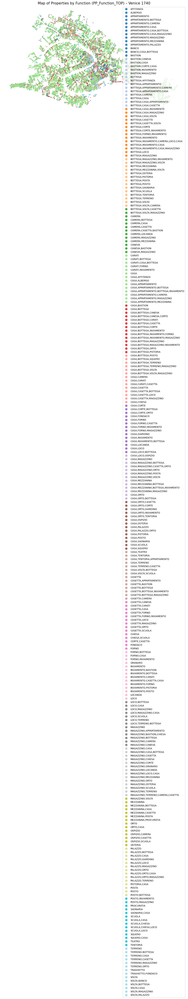

In [106]:

gdf = gpd.read_file("1740-catastici/1740_catastici_version20250625.geojson")
gdf_valid = gdf[gdf['PP_Function_TOP'].notna() & gdf.geometry.notna()].copy()
fig, ax = plt.subplots(figsize=(14, 12))
gdf_valid.plot(
    ax=ax,
    column='PP_Function_MID',
    cmap='tab20',
    legend=True,
    markersize=6,
    alpha=0.85,
    categorical=True
)
ax.set_title("Map of Properties by Function (PP_Function_TOP) – Venice 1740", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()

In [107]:
needs = pd.read_csv("1740-catastici/index/dictionaries/bottega2std[95]2.csv", sep=';')
needs.head()

,function_bottega_kind,count,normalisation,traduction_fr,translation_en,top_level_category,FLAG
0,VENDI,NaN,?,?,To ignore,_IGNORE,0
1,VENDER,NaN,?,?,(?),LIBERAL_PROFESSION,0
2,BARBARO,1.0,?,?,(?),OTHER,0
3,ACQUA,41.0,ACQUA,vendeur d'eau,(Object) Water,FOOD_DRINK,"1, 2, 3"
4,ACQUE,21.0,ACQUA,vendeur d'eau,(Object) Water,FOOD_DRINK,"1, 2, 3"


In [108]:
def extract_needs_flags(flag_str):
    if pd.isna(flag_str) or flag_str.strip() == '0':
        return pd.Series([False, False, False])
    flags = set(x.strip() for x in flag_str.split(","))
    return pd.Series([
        '1' in flags,  # is_nobility_need
        '2' in flags,  # is_middle_class_need
        '3' in flags   # is_lower_class_need
    ])


needs[['is_nobility_need', 'is_middle_class_need', 'is_lower_class_need']] = \
    needs['FLAG'].apply(extract_needs_flags)
needs = needs.drop(columns=['FLAG'])
needs.head(20)

,function_bottega_kind,count,normalisation,traduction_fr,translation_en,top_level_category,is_nobility_need,is_middle_class_need,is_lower_class_need
0,VENDI,NaN,?,?,To ignore,_IGNORE,False,False,False
1,VENDER,NaN,?,?,(?),LIBERAL_PROFESSION,False,False,False
2,BARBARO,1.0,?,?,(?),OTHER,False,False,False
3,ACQUA,41.0,ACQUA,vendeur d'eau,(Object) Water,FOOD_DRINK,True,True,True
4,ACQUE,21.0,ACQUA,vendeur d'eau,(Object) Water,FOOD_DRINK,True,True,True
5,AQUA,12.0,ACQUA,vendeur d'eau,(Object) Water,FOOD_DRINK,True,True,True
6,AQUE,23.0,ACQUA,vendeur d'eau,(Object) Water,FOOD_DRINK,True,True,True
7,ACQUAVITA,2.0,ACQUAVITA,vendeur d'eau de vie,(Object) Spirit,FOOD_DRINK,True,True,True
8,ACQUAVITE,5.0,ACQUAVITA,vendeur d'eau de vie,(Object) Spirit,FOOD_DRINK,True,True,True
9,AQUAVITA,1.0,ACQUAVITA,vendeur d'eau de vie,(Object) Spirit,FOOD_DRINK,True,True,True


In [109]:

gdf.PP_Bottega_STD.head()

0       BARBIER
1          None
2    STRAZZAROL
3    STRAZZAROL
4        TENTOR
Name: PP_Bottega_STD, dtype: object

In [110]:
gdf = gdf.merge(
    needs[['normalisation', 'is_nobility_need', 'is_middle_class_need', 'is_lower_class_need']],
    how='left',
    left_on='PP_Bottega_STD',
    right_on='normalisation'
)


gdf = gdf.drop(columns=['normalisation'])

In [111]:
gdf.head()

,uid,author,tif_path_img,owner_code,owner_count,PP_OwnerCode_SIMPL,owner_name,ten_name,function,an_rendi,...,PP_Owner_Title,PP_Owner_Entity,PP_Owner_FirstName,PP_Owner_LastName,owner_mestiere_std,PP_Owner_Notes,geometry,is_nobility_need,is_middle_class_need,is_lower_class_need
0,CNC-0001,Davide Drago,/catastici/Catastici-436/10/1393.tif,PPL,1,Private,Liberal Campi secondo prete titolato della Chiesa,Francesco Zeni,casa e bottega da barbier,70,...,SECONDO PRETE,None,Liberal,CAMPI,,PERSON,POINT (291832.846 5035321.328),True,True,False
1,CNC-0001,Davide Drago,/catastici/Catastici-436/10/1393.tif,PPL,1,Private,Liberal Campi secondo prete titolato della Chiesa,Francesco Zeni,casa e bottega da barbier,70,...,SECONDO PRETE,None,Liberal,CAMPI,,PERSON,POINT (291832.846 5035321.328),True,True,False
2,CNC-0001,Davide Drago,/catastici/Catastici-436/10/1393.tif,PPL,1,Private,Liberal Campi secondo prete titolato della Chiesa,Francesco Zeni,casa e bottega da barbier,70,...,SECONDO PRETE,None,Liberal,CAMPI,,PERSON,POINT (291832.846 5035321.328),True,True,False
3,CNC-0001,Davide Drago,/catastici/Catastici-436/10/1393.tif,PPL,1,Private,Liberal Campi secondo prete titolato della Chiesa,Francesco Zeni,casa e bottega da barbier,70,...,SECONDO PRETE,None,Liberal,CAMPI,,PERSON,POINT (291832.846 5035321.328),True,True,False
4,CNC-0002,Davide Drago,/catastici/Catastici-436/10/1393.tif,PPL,1,Private,Filippo Frari terzo prete titolato della Chiesa,Dio M'aiuti Lazara,casa,60,...,TERZO PRETE,None,Filippo,FRARI,,PERSON,POINT (291841.531 5035307.749),False,False,False


In [112]:
gdf = gdf.merge(
    df_sociale[['name', 'is_nobility','is_religious', 'is_middle_class', 'is_lower_class']],
    how='left',
    left_on='owner_name',
    right_on='name'

)

gdf = gdf.drop(columns=['name'])

In [113]:
gdf = gdf.rename(columns={
    'is_nobility': 'is_nobility_owner',
    'is_religious': 'is_religious_owner',
    'is_middle_class': 'is_middle_class_owner',
    'is_lower_class': 'is_lower_class_owner'
})


In [114]:
gdf = gdf.merge(
    df_sociale[['name', 'is_nobility','is_religious', 'is_middle_class', 'is_lower_class']],
    how='left',
    left_on='ten_name',
    right_on='name'

)

gdf = gdf.drop(columns=['name'])

In [115]:
gdf = gdf.rename(columns={
    'is_nobility': 'is_nobility_ten',
    'is_religious': 'is_religious_ten',
    'is_middle_class': 'is_middle_ten',
    'is_lower_class': 'is_lower_class_ten'
})

In [3]:

gdf = gpd.read_file("1740-catastici/1740_catastici_version20250625.geojson")
parishes_gdf = gpd.read_file("1740_redrawn_parishes_cleaned_wikidata_standardised.geojson")

if parishes_gdf.crs != gdf.crs:
    parishes_gdf = parishes_gdf.to_crs(gdf.crs)

gdf_with_parish = gpd.sjoin(
    gdf,
    parishes_gdf[['NAME', 'geometry']],
    how='left',
    predicate='within'
)

gdf_with_parish = gdf_with_parish.rename(columns={'NAME': 'parish_name'})

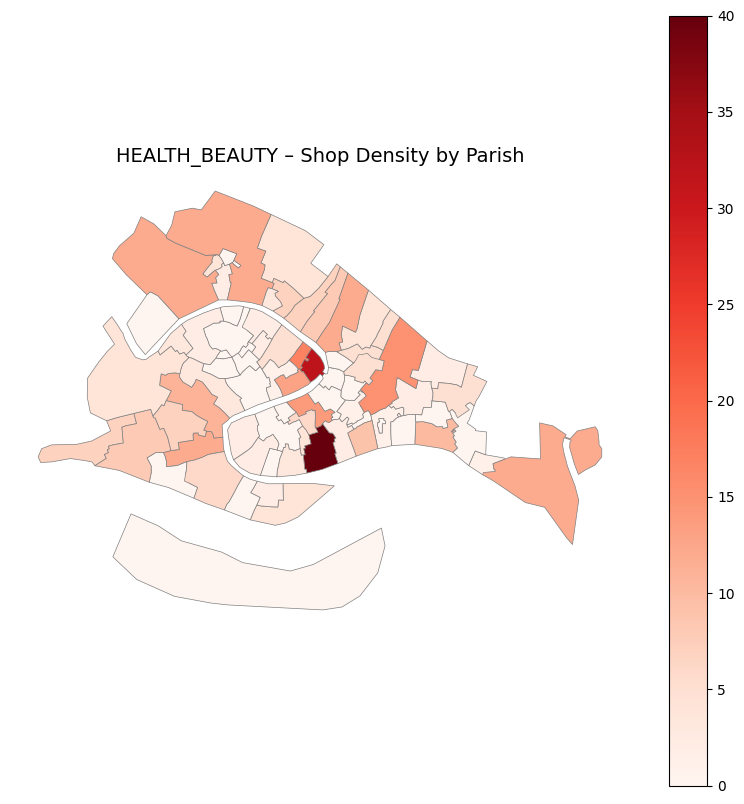

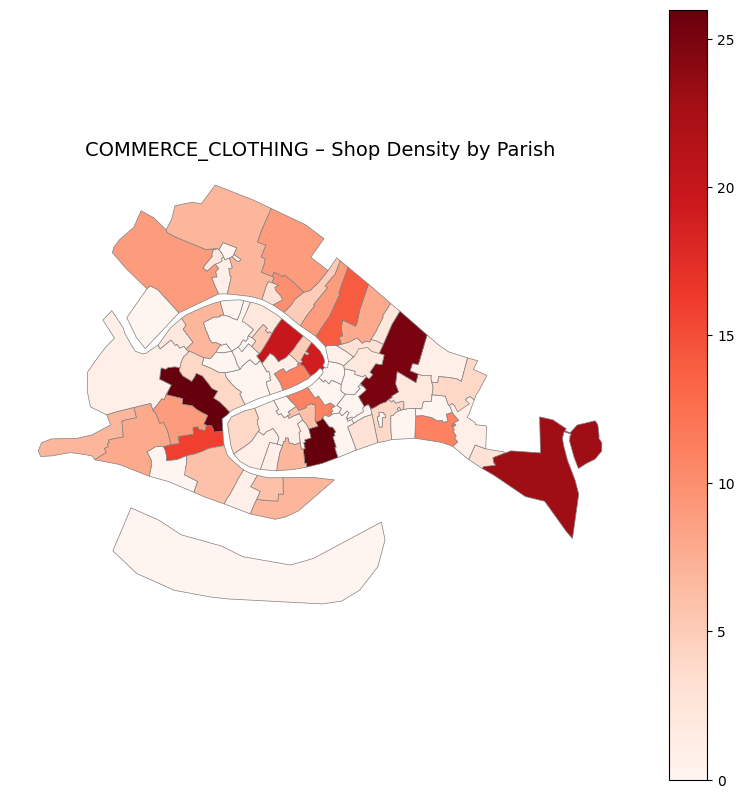

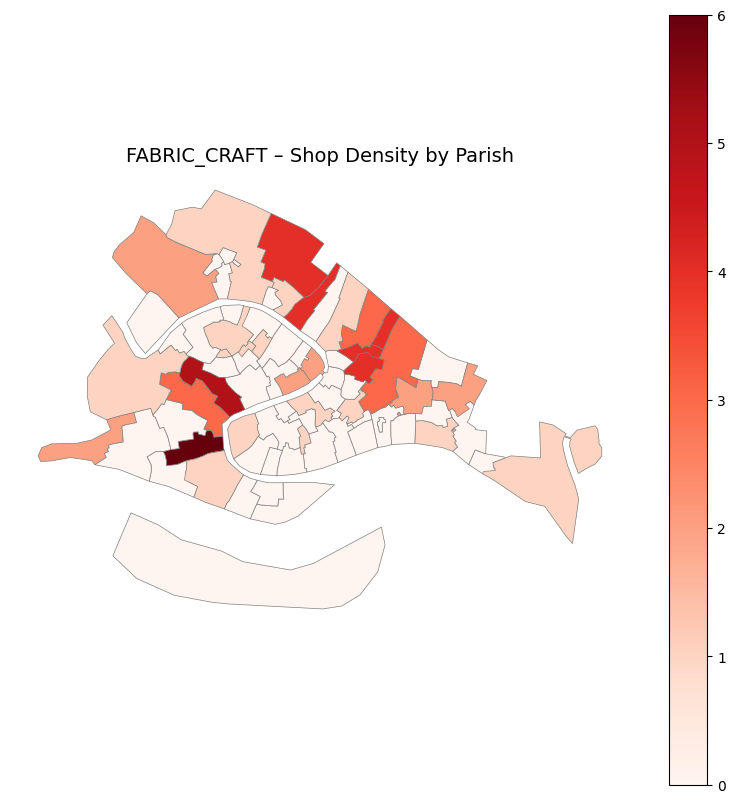

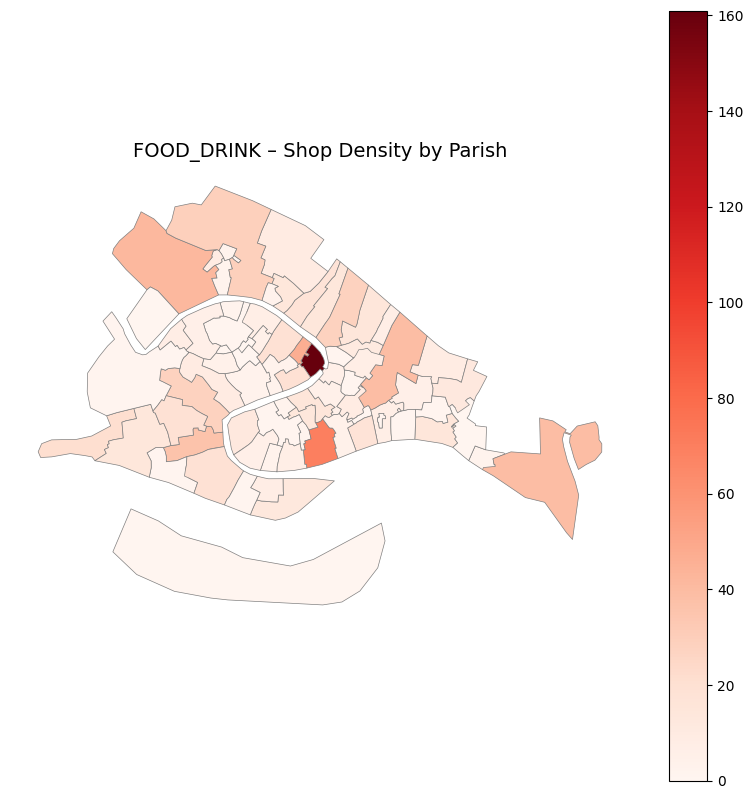

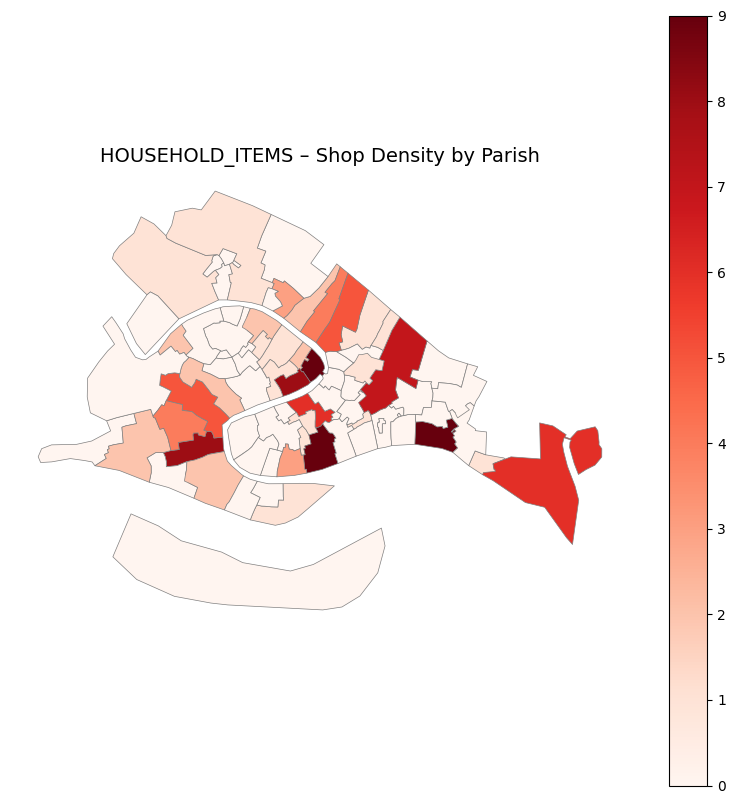

...

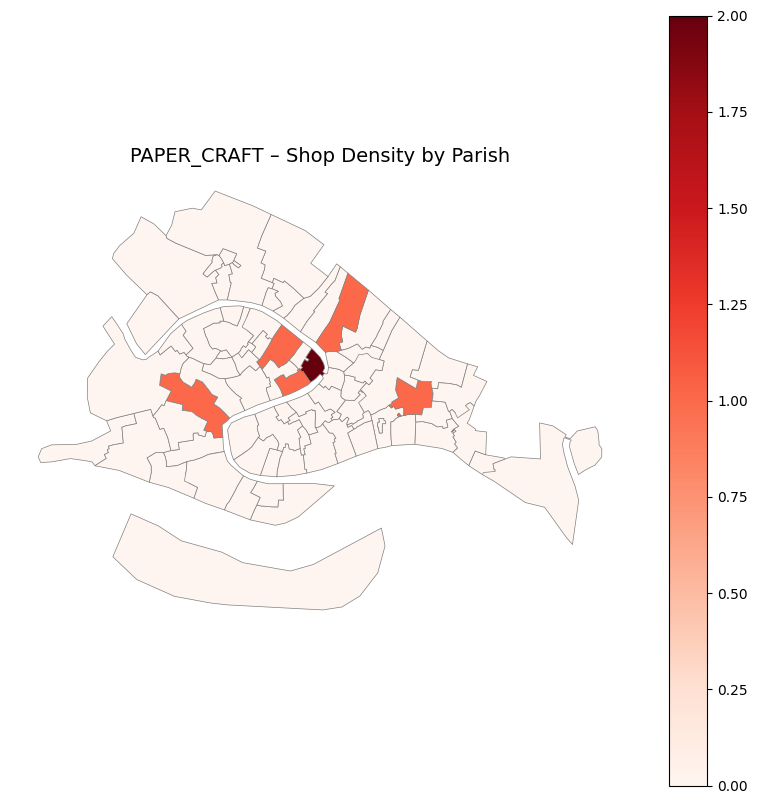

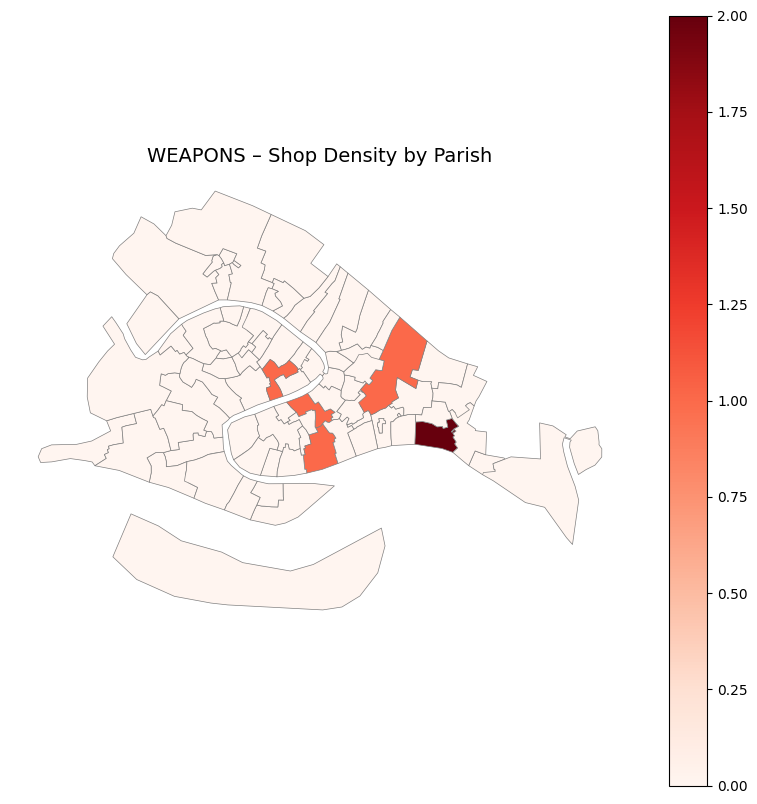

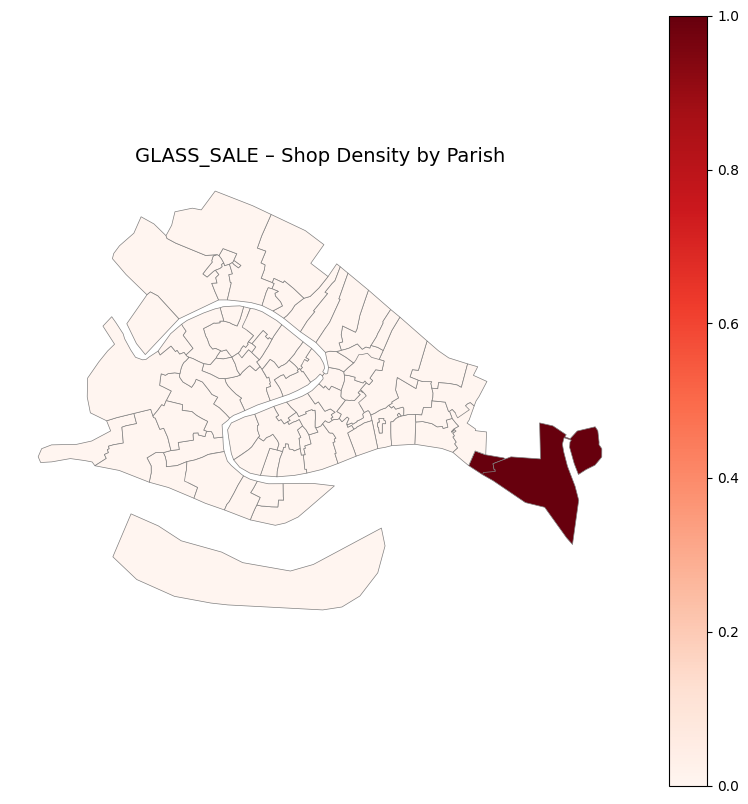

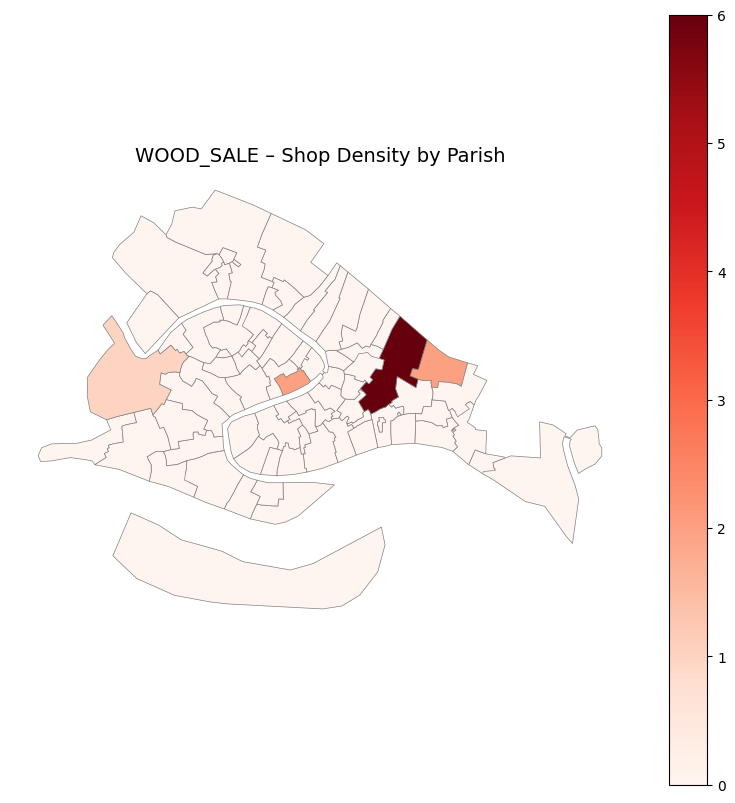

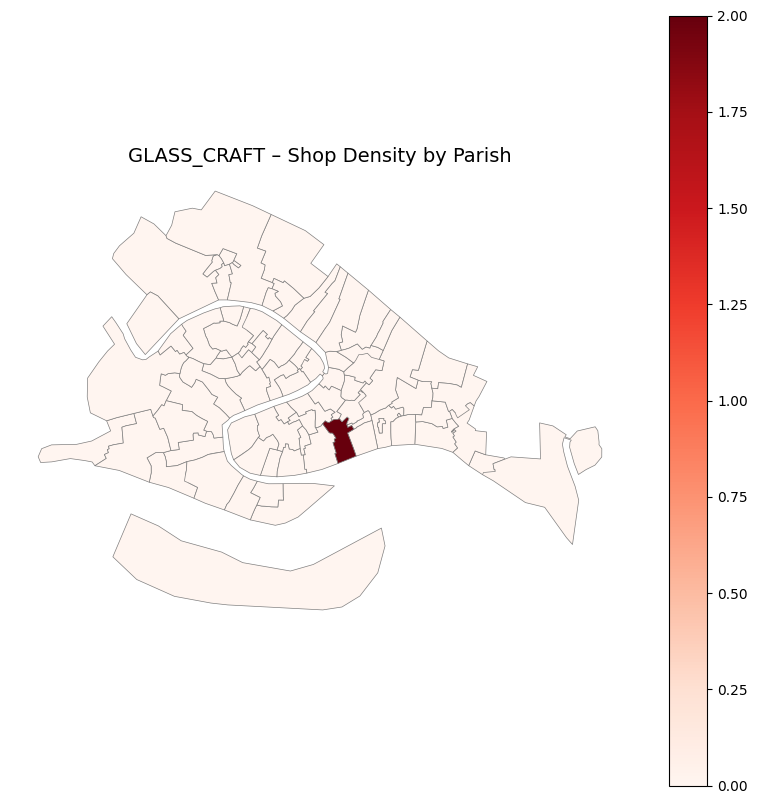

In [6]:
import geopandas as gpd
import matplotlib.pyplot as plt
import os

output_folder = "shop_parish_heatmaps"
os.makedirs(output_folder, exist_ok=True)

shop_types = gdf_with_parish['PP_Bottega_METACATEGORY'].dropna().unique()

for shop_type in shop_types:
    shops = gdf_with_parish[gdf_with_parish['PP_Bottega_METACATEGORY'] == shop_type]

    shop_counts = shops.groupby('parish_name').size().rename('count')

    merged = parishes_gdf.merge(shop_counts, left_on='NAME', right_on='parish_name', how='left')

    merged['count'] = merged['count'].fillna(0)
    fig, ax = plt.subplots(figsize=(10, 10))
    merged.plot(column='count', cmap='Reds', linewidth=0.5, edgecolor='gray', ax=ax, legend=True)
    ax.set_title(f"{shop_type} – Shop Density by Parish", fontsize=14)
    ax.axis('off')
    filename = f"{shop_type.replace('/', '_')}_heatmap.png"
    plt.savefig(os.path.join(output_folder, filename), dpi=150, bbox_inches='tight')
    plt.show()
    plt.close()

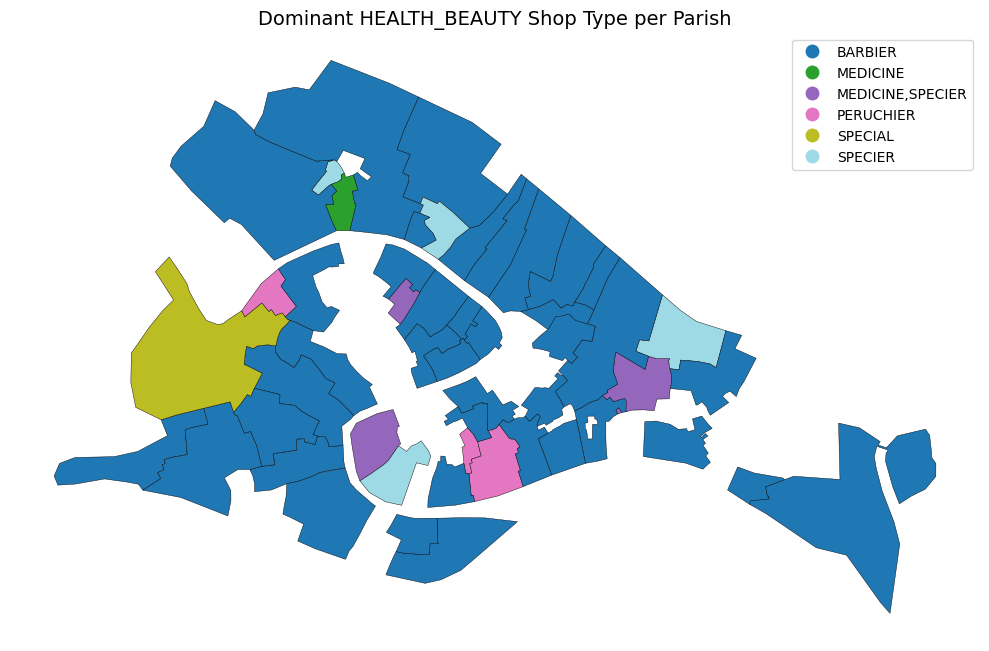

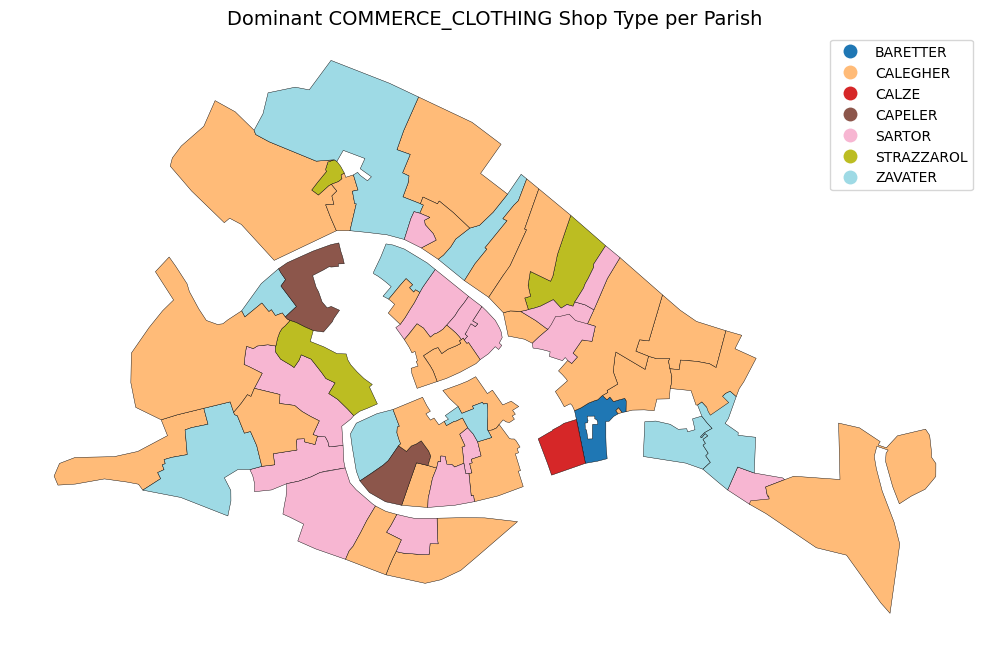

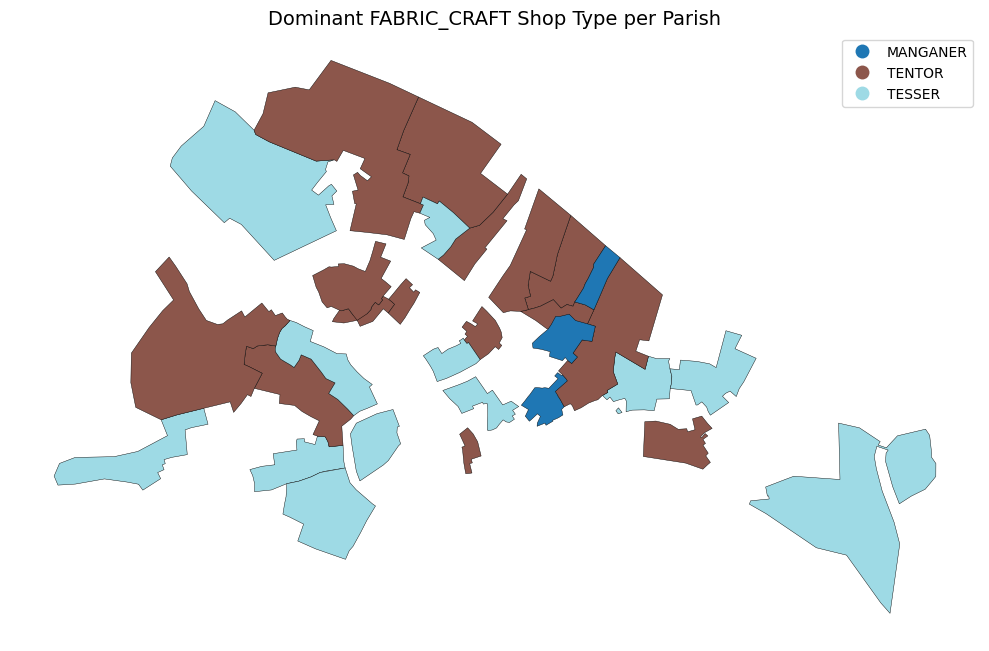

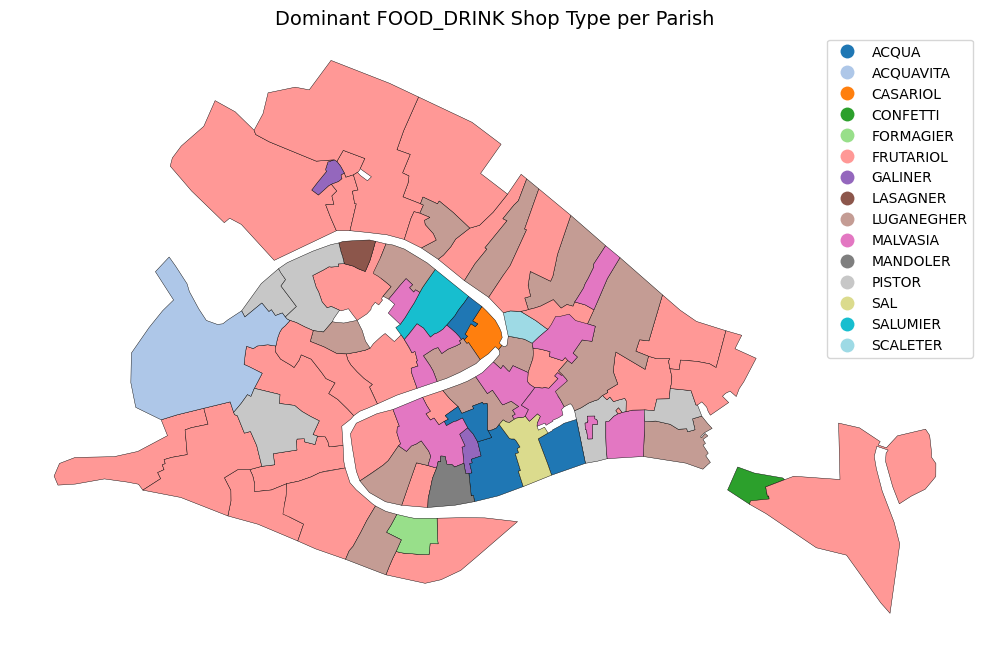

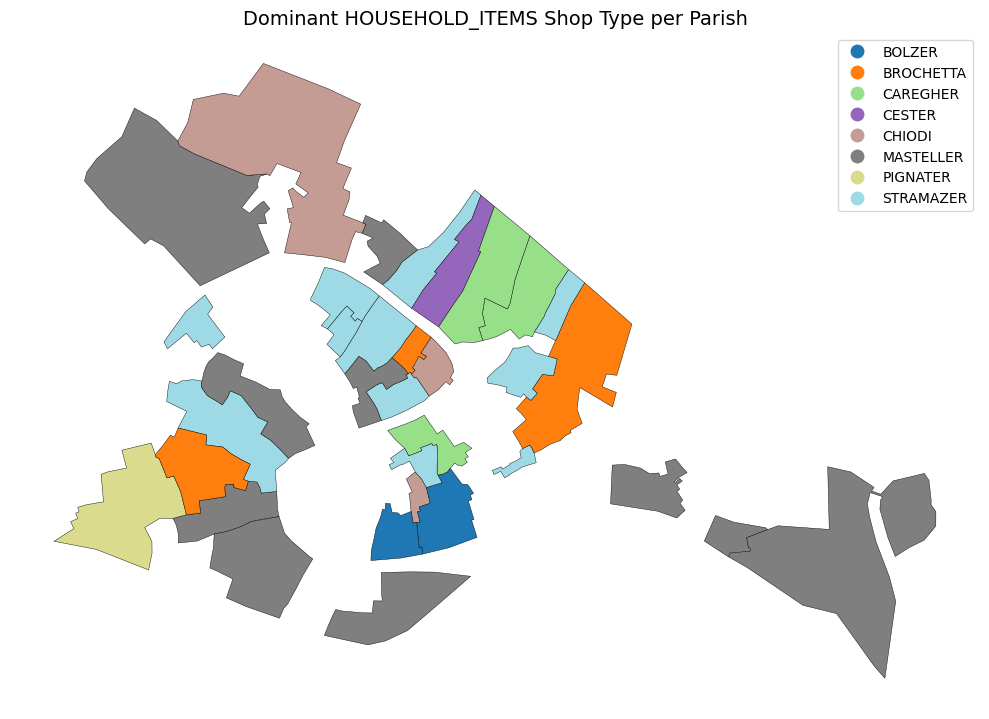

...

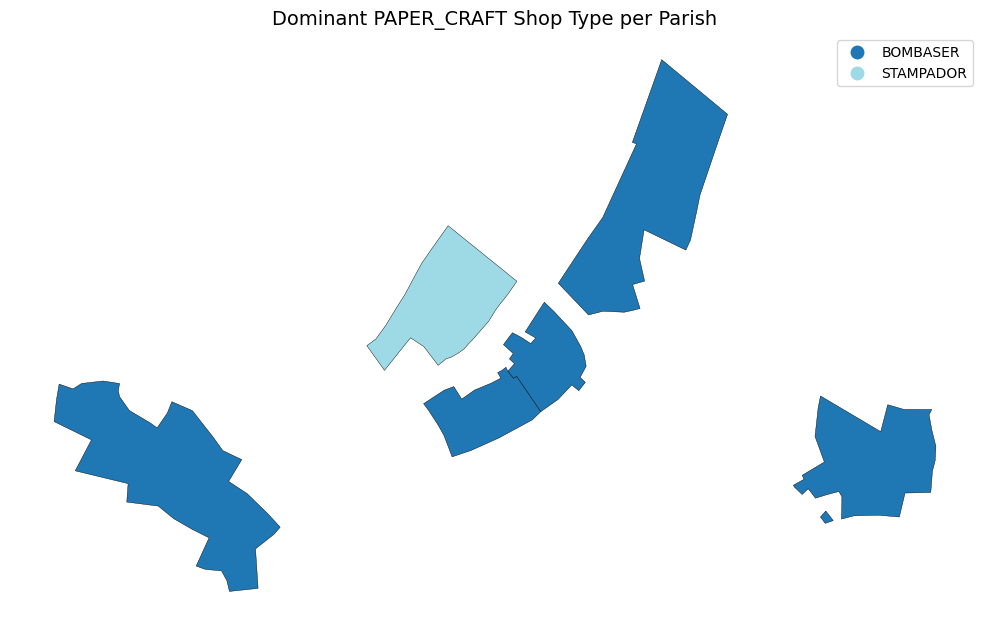

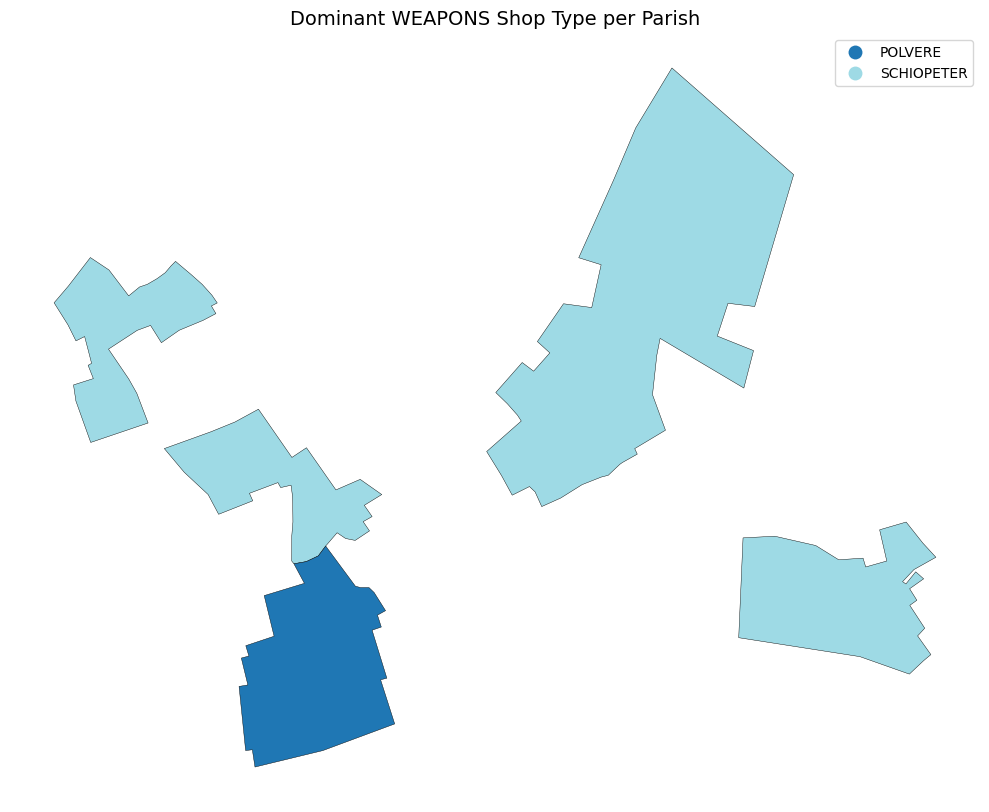

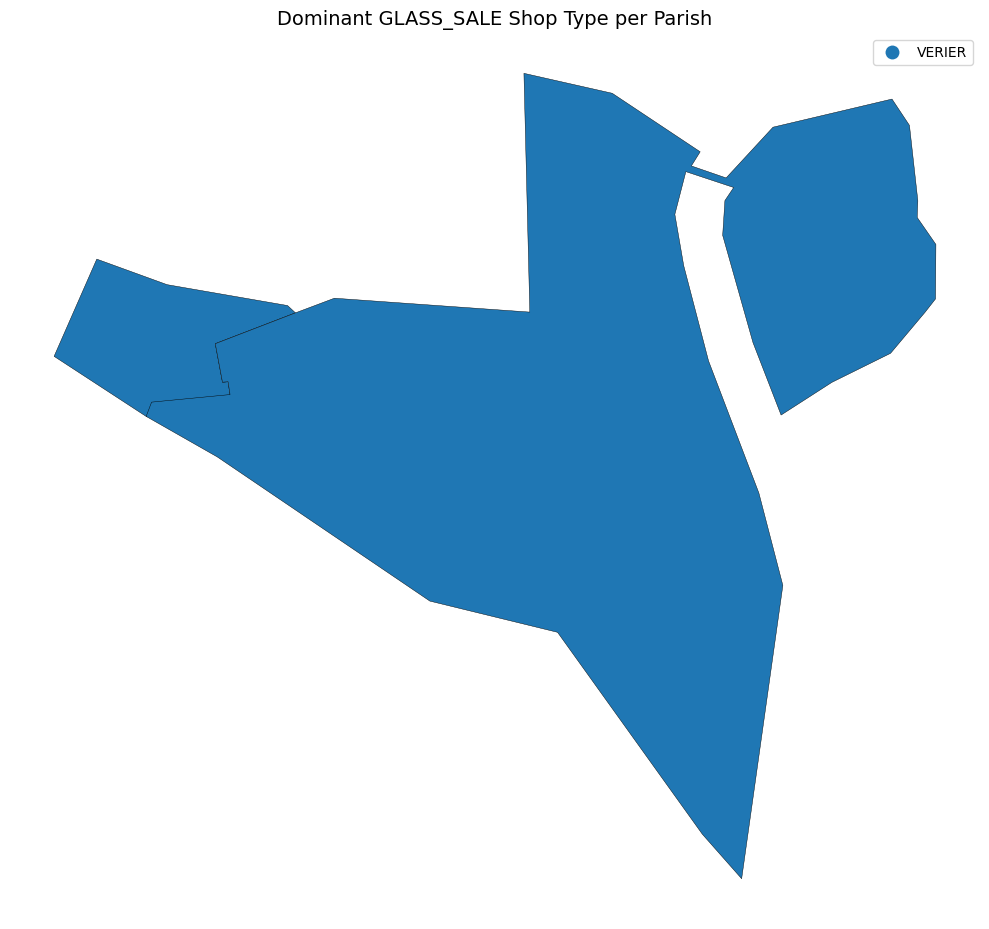

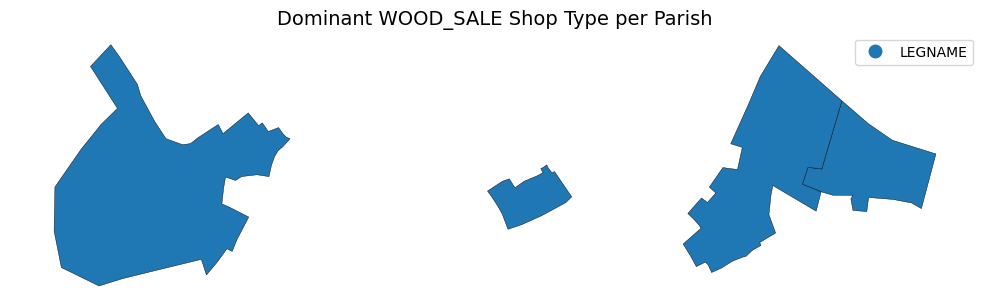

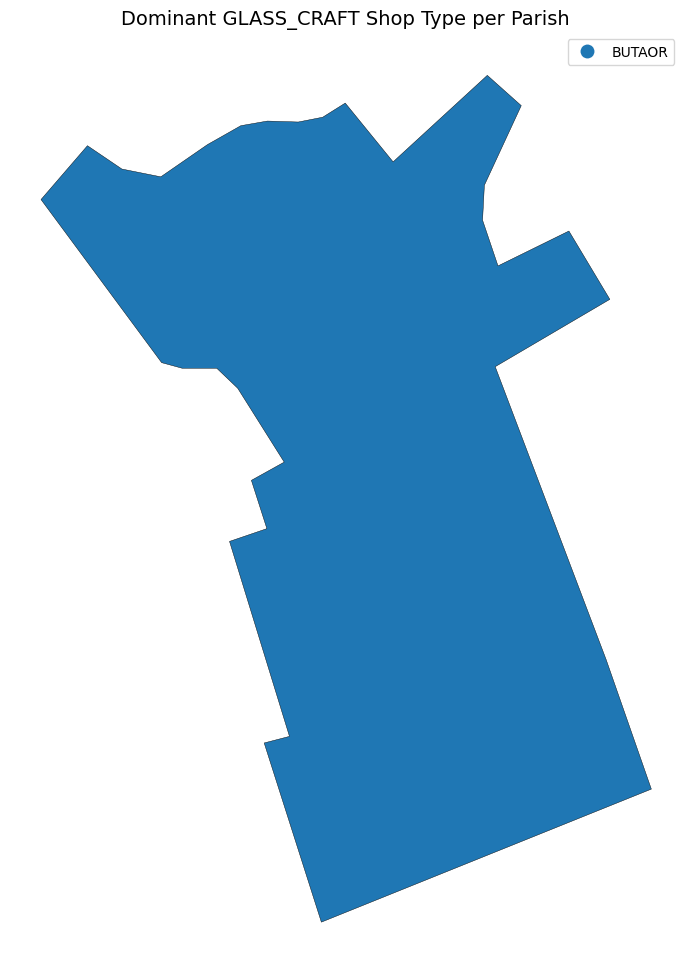

In [7]:

if parishes_gdf.crs != gdf_with_parish.crs:
    parishes_gdf = parishes_gdf.to_crs(gdf_with_parish.crs)


output_folder = "dominant_shoptype_per_metacategory"
os.makedirs(output_folder, exist_ok=True)

metacategories = gdf_with_parish['PP_Bottega_METACATEGORY'].dropna().unique()

for category in metacategories:
    subset = gdf_with_parish[gdf_with_parish['PP_Bottega_METACATEGORY'] == category].copy()
    
    dominant = (
        subset.groupby(['parish_name', 'PP_Bottega_STD'])
        .size()
        .reset_index(name='count')
        .sort_values('count', ascending=False)
        .drop_duplicates('parish_name')
    )
    merged = parishes_gdf.merge(dominant, left_on='NAME', right_on='parish_name', how='left')

    fig, ax = plt.subplots(figsize=(10, 10))
    merged.plot(column='PP_Bottega_STD', ax=ax, legend=True, edgecolor='black', linewidth=0.3, cmap='tab20')
    ax.set_title(f"Dominant {category} Shop Type per Parish", fontsize=14)
    ax.axis('off')
    plt.tight_layout()
    plt.savefig(os.path.join(output_folder, f"{category}_dominant_per_parish.png"), dpi=150)
    plt.show()
    plt.close()

In [10]:
ghetto_names = ['Ghetto Nuovissimo', 'Ghetto Nuovo', 'Ghetto Vecchio']
ghetto_df = gdf_with_parish[gdf_with_parish['parish_name'].isin(ghetto_names)]

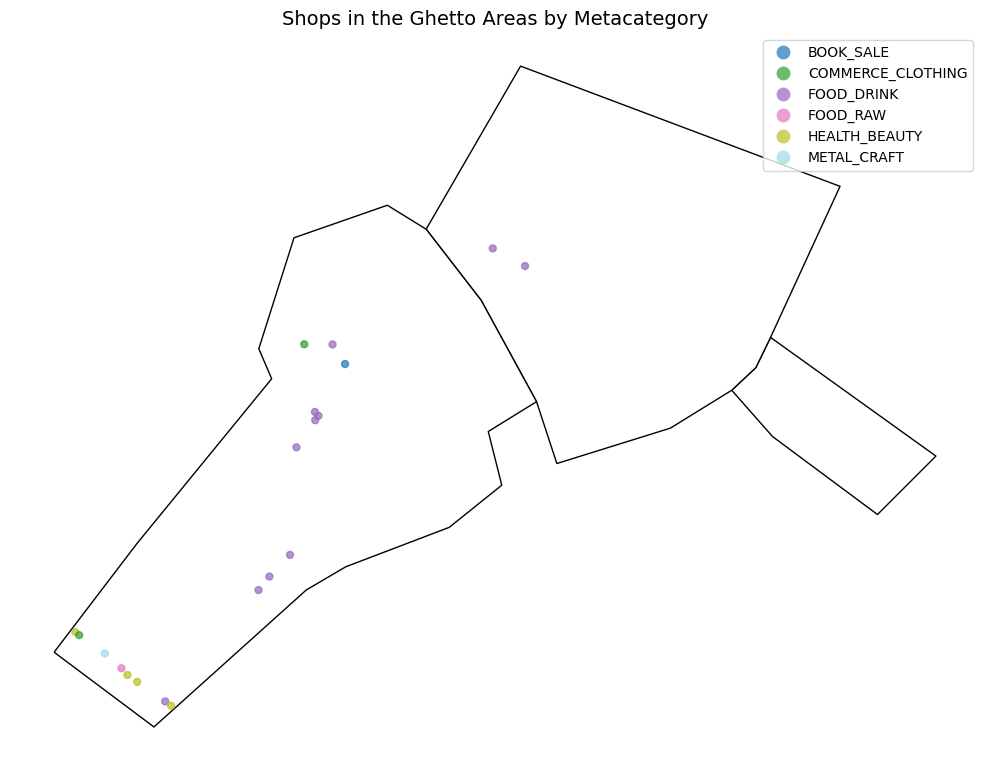

In [18]:
ghetto_names = ['Ghetto Nuovo', 'Ghetto Vecchio', 'Ghetto Nuovissimo']
ghetto_parishes = parishes_gdf[parishes_gdf['NAME'].isin(ghetto_names)]
ghetto_shops = gdf_with_parish[gdf_with_parish['parish_name'].isin(ghetto_names)].copy()

fig, ax = plt.subplots(figsize=(10, 10))
ghetto_parishes.plot(ax=ax, facecolor='white', edgecolor='black')
ghetto_shops.plot(ax=ax, column='PP_Bottega_METACATEGORY', legend=True, markersize=25, alpha=0.7, cmap='tab20')

ax.set_title("Shops in the Ghetto Areas by Metacategory", fontsize=14)
ax.axis('off')
plt.tight_layout()


os.makedirs("ghetto_maps", exist_ok=True)
plt.savefig("ghetto_maps/shops_by_metacategory_points.png", dpi=150)
plt.show()

In [19]:

shop_counts = (
    ghetto_shops['PP_Bottega_METACATEGORY']
    .value_counts()
    .reset_index()
    .rename(columns={'index': 'Metacategory', 'PP_Bottega_METACATEGORY': 'Count'})
)

print(shop_counts)

               Count  count
0         FOOD_DRINK     11
1      HEALTH_BEAUTY      4
2  COMMERCE_CLOTHING      2
3        METAL_CRAFT      1
4           FOOD_RAW      1
5          BOOK_SALE      1


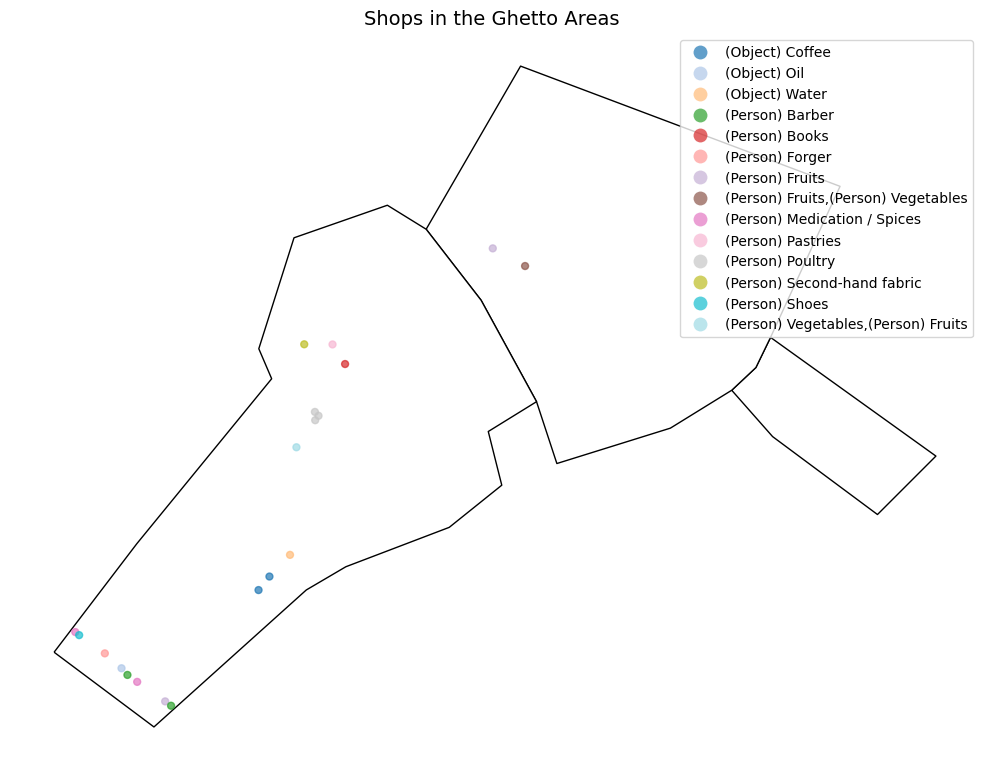

In [35]:

fig, ax = plt.subplots(figsize=(10, 10))
ghetto_parishes.plot(ax=ax, facecolor='white', edgecolor='black')
ghetto_shops.plot(ax=ax, column='PP_Bottega_TRAD', legend=True, markersize=25, alpha=0.7, cmap='tab20')

ax.set_title("Shops in the Ghetto Areas ", fontsize=14)
ax.axis('off')
plt.tight_layout()
os.makedirs("ghetto_maps", exist_ok=True)
plt.savefig("ghetto_maps/shops_by_metacategory_points.png", dpi=150)
plt.show()

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
ghetto_parishes.plot(ax=ax, facecolor='white', edgecolor='black')
ghetto_shops.plot(ax=ax, column='PP_Bottega_TRAD', legend=True, markersize=25, alpha=0.7, cmap='tab20')

ax.set_title("Shops in the Ghetto Areas by Metacategory", fontsize=14)
ax.axis('off')
plt.tight_layout()


os.makedirs("ghetto_maps", exist_ok=True)
plt.savefig("ghetto_maps/shops_by_metacategory_points.png", dpi=150)
plt.show()

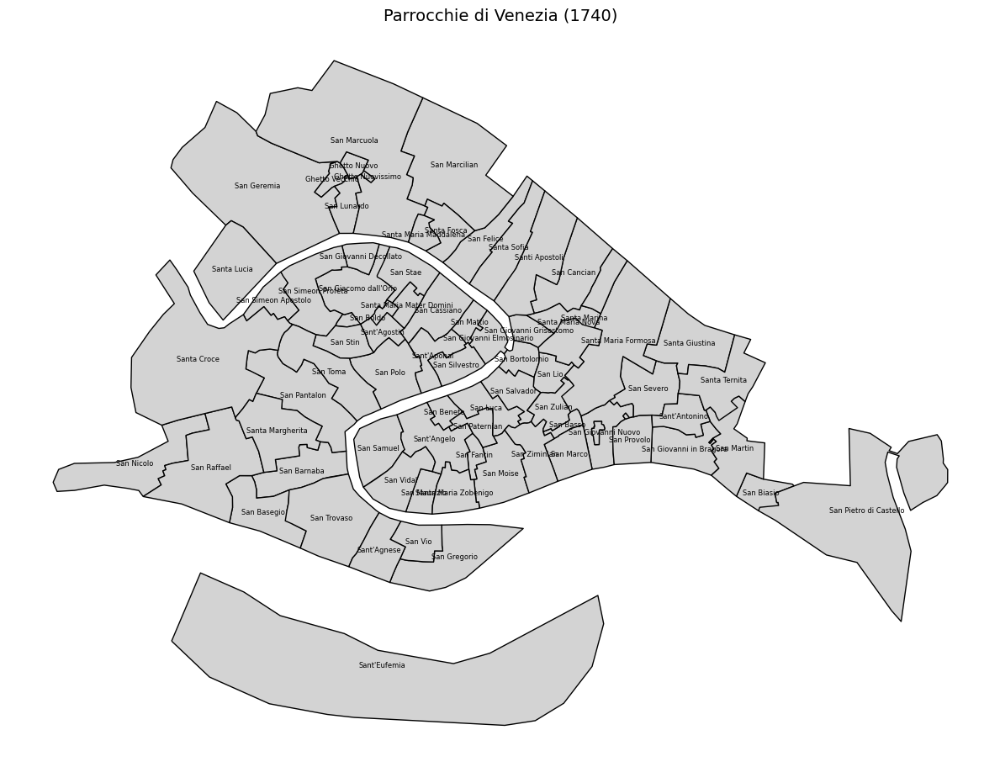

In [22]:
fig, ax = plt.subplots(figsize=(12, 10))
parishes_gdf.plot(ax=ax, edgecolor='black', facecolor='lightgray')

for idx, row in parishes_gdf.iterrows():
    centroid = row.geometry.centroid
    ax.text(centroid.x, centroid.y, row['NAME'], fontsize=6, ha='center', va='center')

ax.set_title("Parrocchie di Venezia (1740)", fontsize=14)
ax.axis('off')

plt.tight_layout()
plt.show()

/var/folders/np/3hhzvb2x6znbzvj6ph2phb8h0000gn/T/ipykernel_179/2072720049.py:7: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  euf_shops.plot(


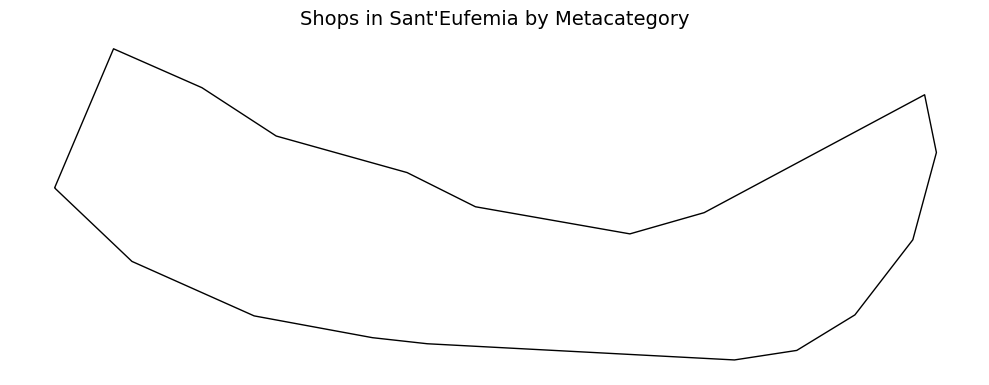

In [23]:

euf_parish = parishes_gdf[parishes_gdf['NAME'] == "Sant'Eufemia"]
euf_shops = gdf_with_parish[gdf_with_parish['parish_name'] == "Sant'Eufemia"].copy()

fig, ax = plt.subplots(figsize=(10, 10))
euf_parish.plot(ax=ax, facecolor='white', edgecolor='black')
euf_shops.plot(
    ax=ax,
    column='PP_Bottega_METACATEGORY',
    legend=True,
    markersize=25,
    alpha=0.7,
    cmap='tab20'
)

ax.set_title("Shops in Sant'Eufemia by Metacategory", fontsize=14)
ax.axis('off')
plt.tight_layout()

os.makedirs("santeufemia_maps", exist_ok=True)
plt.savefig("santeufemia_maps/shops_by_metacategory_points.png", dpi=150)
plt.show()

/var/folders/np/3hhzvb2x6znbzvj6ph2phb8h0000gn/T/ipykernel_179/448807770.py:7: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  euf_shops.plot(


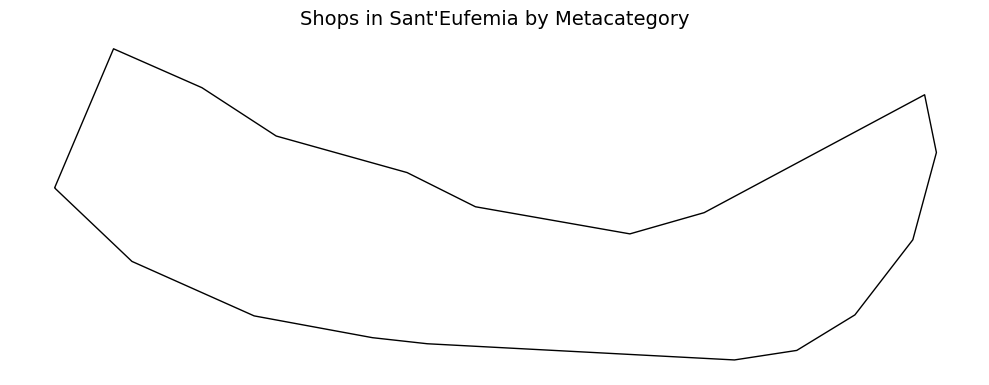

In [24]:
euf_parish = parishes_gdf[parishes_gdf['NAME'] == "Sant'Eufemia"]
euf_shops = gdf_with_parish[gdf_with_parish['parish_name'] == "Sant'Eufemia"].copy()

fig, ax = plt.subplots(figsize=(10, 10))
euf_parish.plot(ax=ax, facecolor='white', edgecolor='black')
euf_shops.plot(
    ax=ax,
    column='PP_Function_TOP',
    legend=True,
    markersize=25,
    alpha=0.7,
    cmap='tab20'
)

ax.set_title("Shops in Sant'Eufemia by Metacategory", fontsize=14)
ax.axis('off')
plt.tight_layout()

os.makedirs("santeufemia_maps", exist_ok=True)
plt.savefig("santeufemia_maps/shops_by_metacategory_points.png", dpi=150)
plt.show()

In [30]:
gdf_with_parish[gdf_with_parish['parish_name'].str.contains('Agostin', case=False, na=False)]['PP_Bottega_METACATEGORY'].value_counts()

Series([], Name: count, dtype: int64)

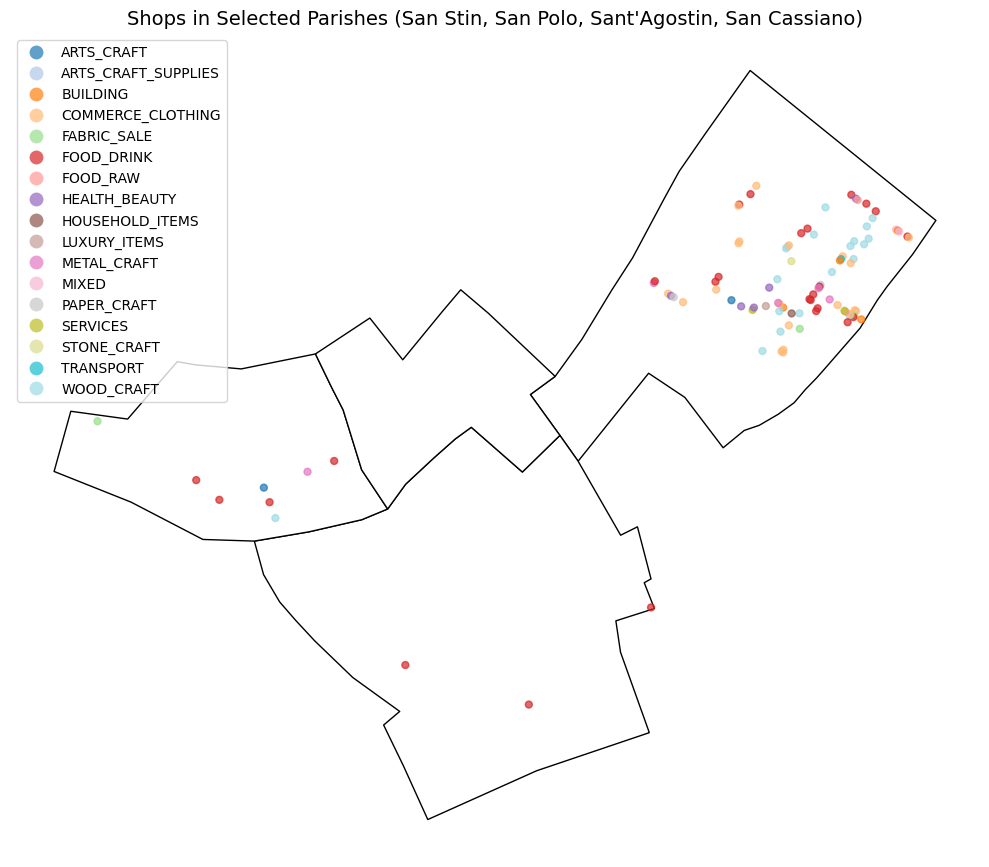

In [34]:
target_parishes = ['San Stin', 'San Polo', 'San Cassiano', "Sant'Agostin"]

selected_parishes = parishes_gdf[parishes_gdf['NAME'].isin(target_parishes)]

selected_shops = gdf_with_parish[gdf_with_parish['parish_name'].isin(target_parishes)]
fig, ax = plt.subplots(figsize=(10, 10))
selected_parishes.plot(ax=ax, facecolor='white', edgecolor='black')
selected_shops.plot(
    ax=ax,
    column='PP_Bottega_METACATEGORY',
    legend=True,
    markersize=25,
    alpha=0.7,
    cmap='tab20'
)

ax.set_title("Shops in Selected Parishes (San Stin, San Polo, Sant'Agostin, San Cassiano)", fontsize=14)
ax.axis('off')
plt.tight_layout()
os.makedirs("selected_parish_maps", exist_ok=True)
plt.savefig("selected_parish_maps/shops_by_metacategory_points.png", dpi=150)
plt.show()

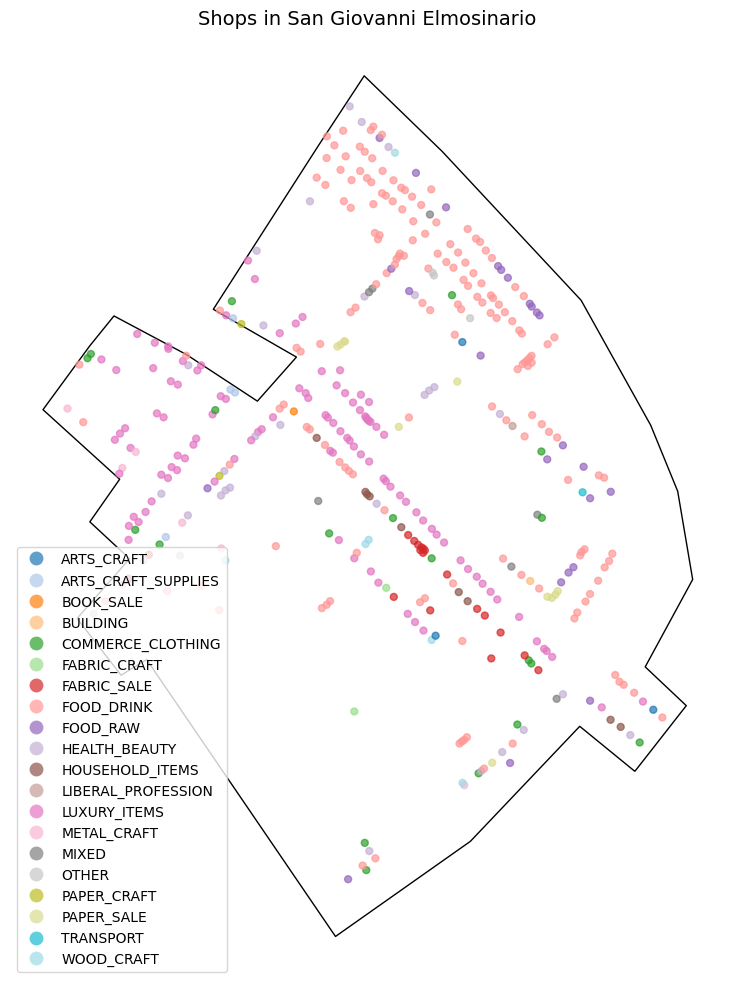

In [33]:

target_parishes = [

    'San Giovanni Elmosinario'
]
selected_parishes = parishes_gdf[parishes_gdf['NAME'].isin(target_parishes)]

selected_shops = gdf_with_parish[gdf_with_parish['parish_name'].isin(target_parishes)]

fig, ax = plt.subplots(figsize=(10, 10))
selected_parishes.plot(ax=ax, facecolor='white', edgecolor='black')
selected_shops.plot(
    ax=ax,
    column='PP_Bottega_METACATEGORY',
    legend=True,
    markersize=25,
    alpha=0.7,
    cmap='tab20'
)

ax.set_title("Shops in San Giovanni Elmosinario", fontsize=14)
ax.axis('off')
plt.tight_layout()
os.makedirs("selected_parish_maps", exist_ok=True)
plt.savefig("selected_parish_maps/shops_by_metacategory_points.png", dpi=150)
plt.show()